In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install
%pip install roboflow

import torch
import os
from IPython.display import Image, clear_output #To display imagres
from roboflow import Roboflow
rf=Roboflow(model_format ="yolov5",notebook =" ultralytics")

Cloning into 'yolov5'...
remote: Enumerating objects: 10732, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 10732 (delta 3), reused 6 (delta 1), pack-reused 10722
Receiving objects: 100% (10732/10732), 10.89 MiB | 13.88 MiB/s, done.
Resolving deltas: 100% (7408/7408), done.
/content/yolov5
     |████████████████████████████████| 596 kB 4.1 MB/s 
     |████████████████████████████████| 145 kB 5.3 MB/s 
     |████████████████████████████████| 178 kB 43.8 MB/s 
     |████████████████████████████████| 1.1 MB 42.2 MB/s 
     |████████████████████████████████| 67 kB 5.0 MB/s 
     |████████████████████████████████| 138 kB 48.8 MB/s 
     |████████████████████████████████| 63 kB 1.6 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.1-py3-none-any.whl size=20916 sha256=ce656f725c15a6feabe03c6e708c14b14d047d4085408db34cac2de27bcecc55
  Stored in directory: /root/.cache/pip/wheels/57/00/03/2d83f3e90ff41c36eef9c3747c328290c

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref= ultralytics


In [ ]:
os.environ["DATASET_DIRECTORY"]="/content/datasets"

In [ ]:
rf = Roboflow(api_key="rIjbqZXlSj434xiHdTim")
project = rf.workspace().project("estacionamiento-bpmbp")
dataset = project.version(6).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/estacionamiento-6 in yolov5pytorch:: 100%|██████████| 810/810 [00:01<00:00, 806.13it/s]


In [ ]:
!python3 train.py --img 416 --batch 16 --epochs 250 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/estacionamiento-6/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=250, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-216-g856d4e5 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degr

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 308), started 1:15:19 ago. (Use '!kill 308' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
!python3 detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.2 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/estacionamiento-5/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-213-gd5966c9 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/85 /content/datasets/estacionamiento-5/valid/images/1200x800_jpg.rf.47a3b4ad8af5d9128dadac470b158c79.jpg: 416x416 1 libre, 5 ocupados, Done. (0.014s)
image 2/85 /content/datasets/estacionamiento-5/valid/images/1506164_jpg.rf.62301768f4a4ac58538a5ad627b3222b.jpg: 416x416 8 ocupados, Done. (0.014s)
image 3/85 /content/datasets/estacionami

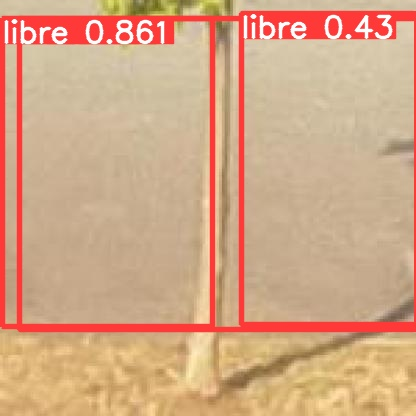

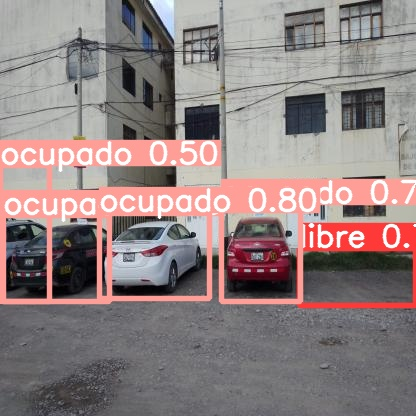

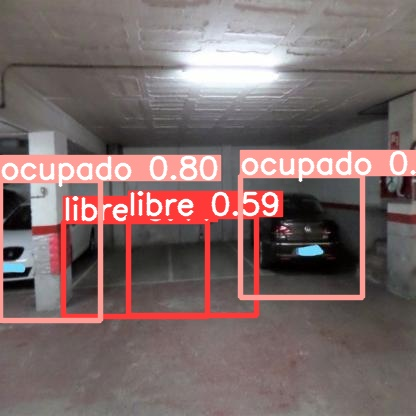

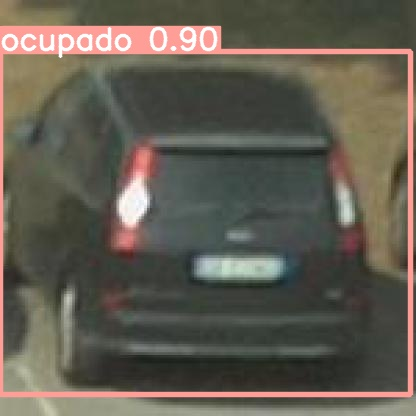

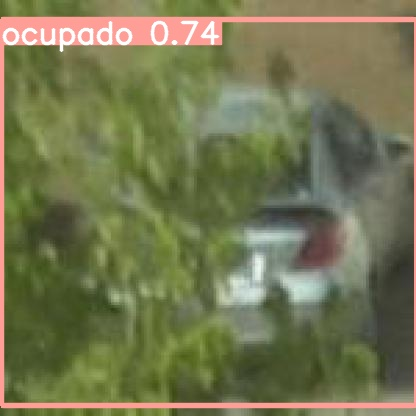

...

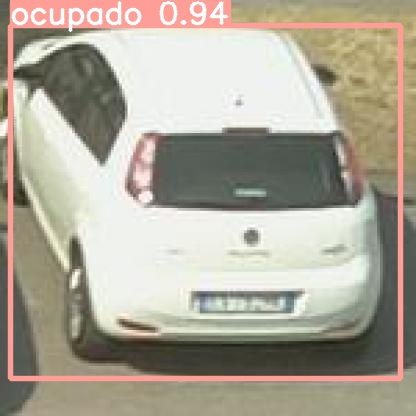

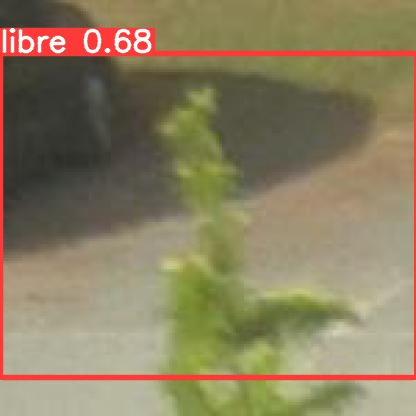

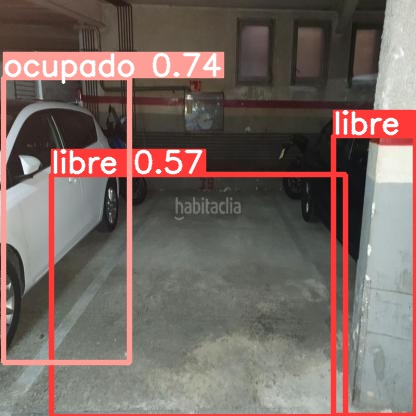

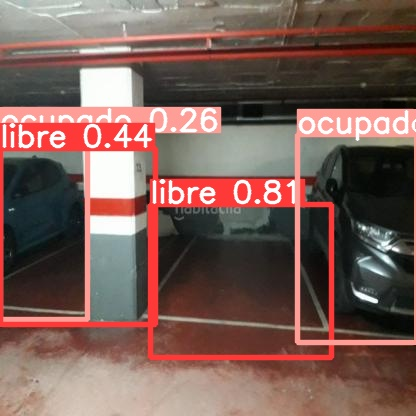

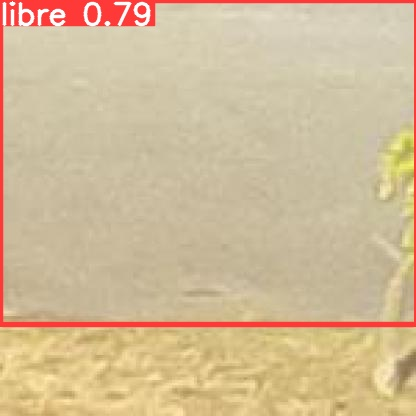

In [ ]:
import glob
from IPython.display import Image, display
i=0

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'):
  i+=0
  if i < 84:
    display(Image(filename = imageName))
    print("\n")
    

In [ ]:
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>